In [1]:
import geoengine as ge
from geoengine.workflow_builder.operators import GdalSource, TemporalRasterAggregation, RasterStacker, RenameBands, \
    Expression,RasterTypeConversion, RasterBandDescriptor
import matplotlib.pyplot as plt
import numpy as np
import xarray as xr
from typing import Tuple, Optional

In [2]:
ge.initialize("https://zentrale.app.geoengine.io/api", token="51c46772-6c55-4867-8e42-c9fd8b614820")

In [3]:
def _query_rectangle(*,
                     center: Tuple[float, float],
                     time: np.datetime64,
                     radius_px: float = 512) -> ge.QueryRectangle:
    resolution = ge.SpatialResolution(10, 10)
    bbox = ge.BoundingBox2D(
        xmin=center[0] - resolution.x_resolution * radius_px,
        xmax=center[0] + resolution.x_resolution * radius_px,
        ymin=center[1] - resolution.y_resolution * radius_px,
        ymax=center[1] + resolution.y_resolution * radius_px,
    )
    return ge.QueryRectangle(
        spatial_bounds=bbox,
        time_interval=ge.TimeInterval(time),
        srs='EPSG:32632',
        resolution=resolution,
    )

async def compute_rgb_array(*,
                      center: Tuple[float, float],
                      time: np.datetime64,
                      radius_px: float = 512,
                      ) -> xr.DataArray:
    '''Compute RGB of area'''

    def cloud_free(band: GdalSource):
        return Expression(
            expression = 'if B > 2 && B < 8 { A } else { NODATA }',
            source=RasterStacker(
            sources=[
                band,
                RasterTypeConversion(
                    GdalSource("_:5779494c-f3a2-48b3-8a2d-5fbba8c5b6c5:`UTM32N:SCL`"),
                    output_data_type='U16',
                ),
            ],
            )
        )
    
    query_rectangle = _query_rectangle(
        center=center,
        time=time,
        radius_px=radius_px,
    )

    workflow = TemporalRasterAggregation(
        aggregation_type='mean', # 'percentileEstimate',
        # percentile=0.5,
        granularity='months',
        window_size=1,
        ignore_no_data=True,
        source=RasterStacker(
            sources=[
            cloud_free(GdalSource("_:5779494c-f3a2-48b3-8a2d-5fbba8c5b6c5:`UTM32N:B04`")),
            cloud_free(GdalSource("_:5779494c-f3a2-48b3-8a2d-5fbba8c5b6c5:`UTM32N:B03`")),
            cloud_free(GdalSource("_:5779494c-f3a2-48b3-8a2d-5fbba8c5b6c5:`UTM32N:B02`")),
            ],
            rename=RenameBands.rename(['red', 'green', 'blue']),
        )
    )

    workflow = ge.register_workflow(workflow)

    data_array = await workflow.raster_stream_into_xarray(
        query_rectangle=query_rectangle,
        clip_to_query_rectangle=True,
        bands=[0,1,2], # TODO: improve for user, default = all? where are the band names?
    )

    return data_array


async def compute_water_bodies(*,
                      center: Tuple[float, float],
                      time: np.datetime64,
                      radius_px: float = 512,
                      water_body_time_aggregate_months: int = 1,
                      ) -> xr.DataArray:
    '''Compute water body classification'''
    query_rectangle = _query_rectangle(
        center=center,
        time=time,
        radius_px=radius_px,
    )

    workflow = TemporalRasterAggregation(
        aggregation_type='max',
        granularity='months',
        window_size=water_body_time_aggregate_months,
        ignore_no_data=True,
        source=Expression(
            expression='''
                let ndwi = (A-B)/(A+B);
                if C <= 2 || C >= 8 {
                    NODATA
                } else if ndwi >= 0.2 {
                    3
                } else if ndwi >= 0 {
                    2
                } else if ndwi >= -0.3 {
                    1
                } else {
                    0
                }
            ''',
            output_type='U8',
            # output_band=RasterBandDescriptor( # TODO: this is broken in the backend
            #     "water bodies",
            #     measurement=ge.ClassificationMeasurement(
            #         "water bodies",
            #         classes={
            #             0: 'Drought, non-aqueous surfaces',
            #             1: 'Moderate drought, non-aqueous surfaces',
            #             2: 'Flooding, humidity',
            #             3: 'Water surface',
            #         }
            #     ),
            # ),
            source=
                RasterStacker(
                    sources=[
                        GdalSource("_:5779494c-f3a2-48b3-8a2d-5fbba8c5b6c5:`UTM32N:B03`"),
                        GdalSource("_:5779494c-f3a2-48b3-8a2d-5fbba8c5b6c5:`UTM32N:B08`"),
                        RasterTypeConversion(
                            GdalSource("_:5779494c-f3a2-48b3-8a2d-5fbba8c5b6c5:`UTM32N:SCL`"),
                            output_data_type='U16',
                        ),
                    ],
                ),
        ),
    )

    workflow = ge.register_workflow(workflow)

    data_array = await workflow.raster_stream_into_xarray(
        query_rectangle=query_rectangle,
        clip_to_query_rectangle=True,
        bands=[0], # TODO: improve for user, default = all? where are the band names?
    )

    return data_array


def plot(rbg_array: xr.DataArray, water_bodies_array: Optional[xr.DataArray] = None, height_px: int = 1024):
    px = 1/plt.rcParams['figure.dpi']  # pixel in inches

    fig, axes = plt.subplot_mosaic("AB")

    fig.set_figheight(height_px*px)
    fig.set_figwidth(2 * height_px*px)

    rbg_array.isel(time=0).plot.imshow(
        rgb="band",
        vmax=4000,
        ax=axes['A'],
    )

    if water_bodies_array is None:
        fig.show()
        return
    
    water_bodies_array.isel(band=0, time=0, drop=True).plot.imshow(
        colors=[plt.cm.Paired.colors[i] for i in [2, 3, 0, 1]],
        levels=5,
        vmin=0,
        vmax=4,
        ax=axes['B']
    )

    axes['B'].images[-1].colorbar.set_ticks(
        [0,1,2,3],
        labels=[
            'Drought, non-aqueous surfaces',
            'Moderate drought, non-aqueous surfaces',
            'Flooding, humidity',
            'Water surface',
        ],
    )

    fig.show()

    fig, axes = plt.subplot_mosaic("C")

    fig.set_figheight(height_px*px)
    fig.set_figwidth(height_px*px)

    rbg_array.isel(time=0).plot.imshow(
        rgb="band",
        vmax=4000,
        ax=axes['C'],
    )

    water_bodies_array.isel(band=0, time=0, drop=True).plot.imshow(
        colors=[(0,0,0,0), plt.cm.Paired.colors[1]],
        levels=2,
        vmin=3,
        vmax=4,
        add_colorbar=False,
        ax=axes['C']
    )

    fig.show()


In [62]:
marburg_center_utm = [483843, 5627614]

In [63]:
marburg_rgb = await compute_rgb_array(center=marburg_center_utm, time=np.datetime64("2022-07-01T00:00:00"))

/home/beilschmidt/git/geoengine-python/env/lib/python3.10/site-packages/rasterio/windows.py:314: RasterioDeprecationWarning: The height, width, and precision parameters are unused, deprecated, and will be removed in 2.0.0.
  warnings.warn(


In [64]:
marburg_water = await compute_water_bodies(center=marburg_center_utm, time=np.datetime64("2022-07-01T00:00:00"))

/home/beilschmidt/git/geoengine-python/env/lib/python3.10/site-packages/rasterio/windows.py:314: RasterioDeprecationWarning: The height, width, and precision parameters are unused, deprecated, and will be removed in 2.0.0.
  warnings.warn(


/tmp/ipykernel_9616/3560293408.py:180: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/tmp/ipykernel_9616/3560293408.py:202: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/home/beilschmidt/git/geoengine-python/env/lib/python3.10/site-packages/matplotlib/cm.py:478: RuntimeWarning: invalid value encountered in cast
  xx = (xx * 255).astype(np.uint8)


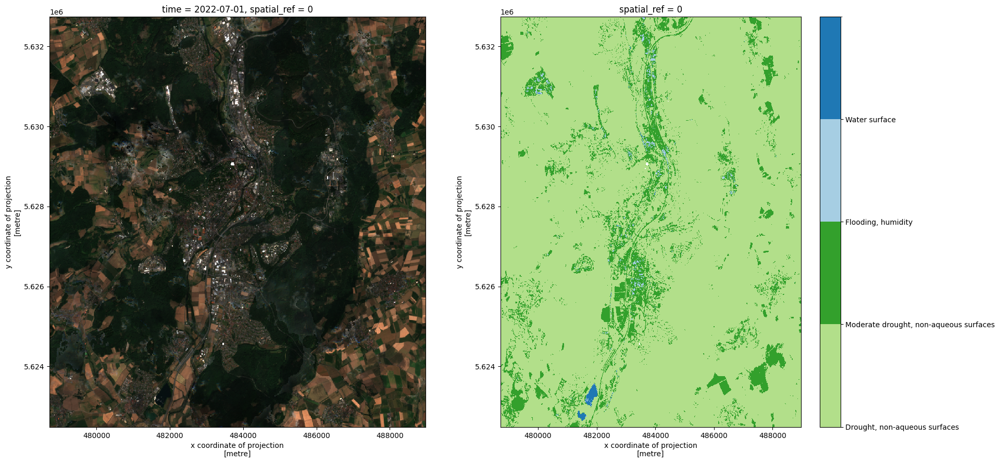

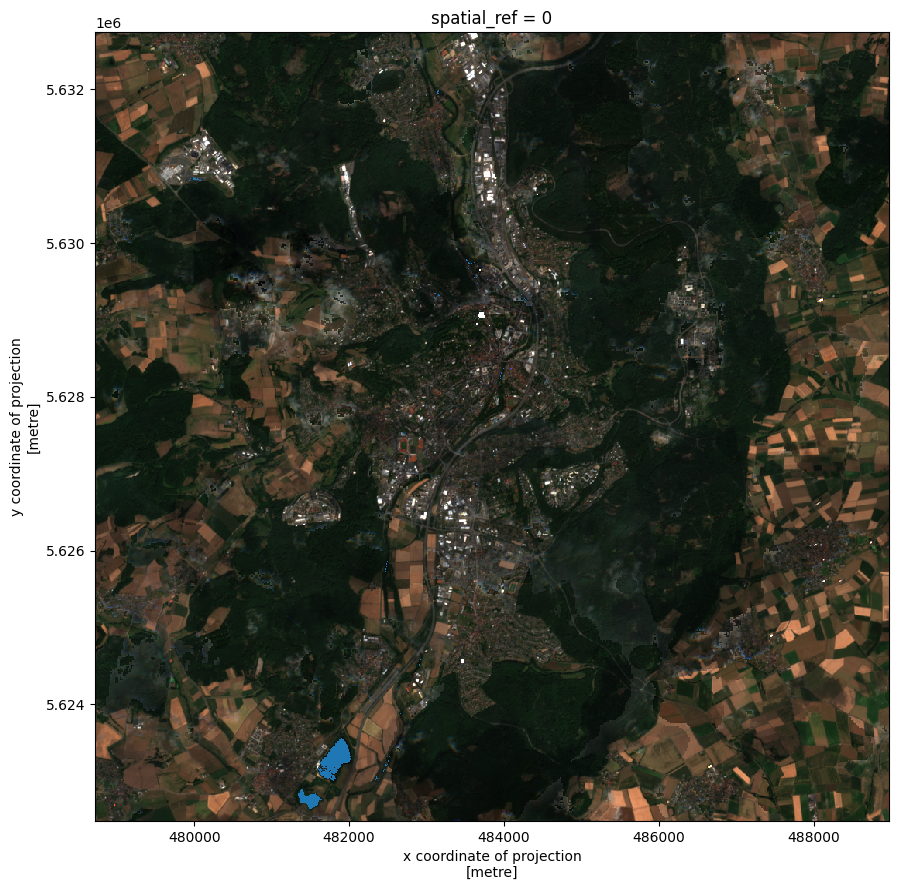

In [86]:
plot(rbg_array=marburg_rgb, water_bodies_array=marburg_water)

/home/beilschmidt/git/geoengine-python/env/lib/python3.10/site-packages/rasterio/windows.py:314: RasterioDeprecationWarning: The height, width, and precision parameters are unused, deprecated, and will be removed in 2.0.0.
  warnings.warn(
/home/beilschmidt/git/geoengine-python/env/lib/python3.10/site-packages/rasterio/windows.py:314: RasterioDeprecationWarning: The height, width, and precision parameters are unused, deprecated, and will be removed in 2.0.0.
  warnings.warn(
/tmp/ipykernel_9616/3560293408.py:180: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/tmp/ipykernel_9616/3560293408.py:202: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/home/beilschmidt/git/geoengine-python/env/lib/python3.10/site-packages/matplotlib/cm.py:478: RuntimeWarning: invalid value encountere

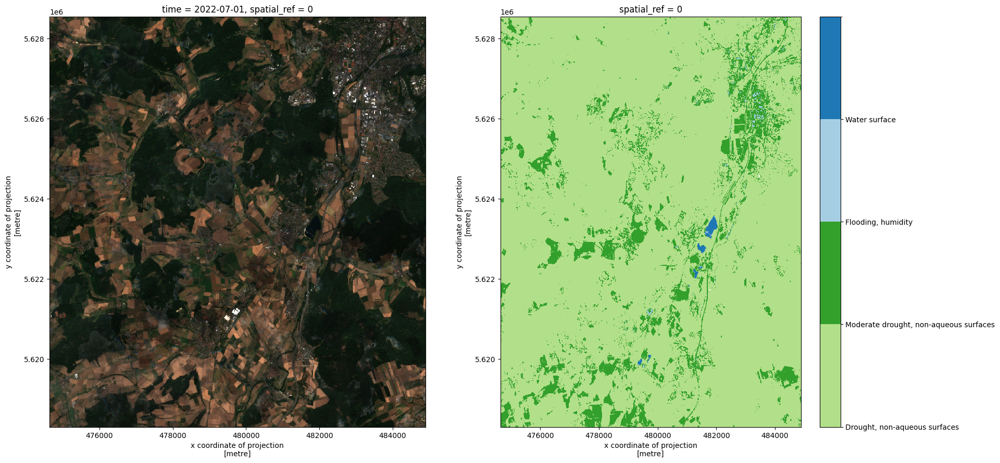

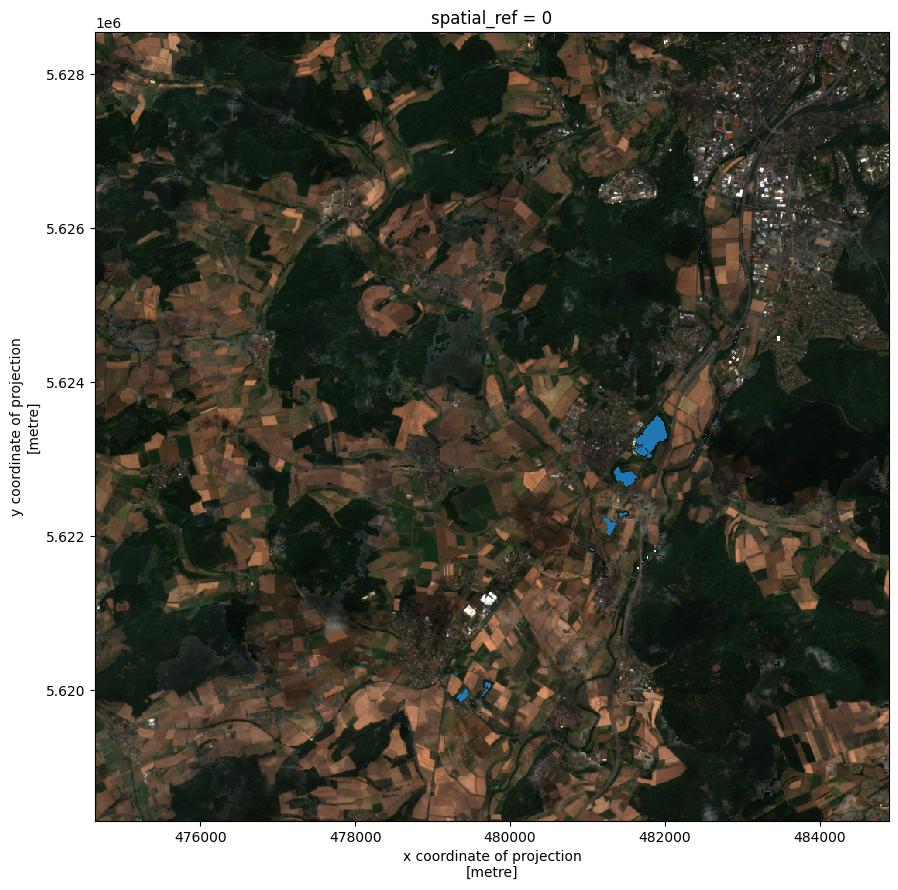

In [87]:
weimar_center_utm = [479763, 5623423]

weimar_rgb = await compute_rgb_array(center=weimar_center_utm, time=np.datetime64("2022-07-01T00:00:00"))

weimar_water = await compute_water_bodies(center=weimar_center_utm, time=np.datetime64("2022-07-01T00:00:00"))

plot(rbg_array=weimar_rgb, water_bodies_array=weimar_water)

/home/beilschmidt/git/geoengine-python/env/lib/python3.10/site-packages/rasterio/windows.py:314: RasterioDeprecationWarning: The height, width, and precision parameters are unused, deprecated, and will be removed in 2.0.0.
  warnings.warn(
/home/beilschmidt/git/geoengine-python/env/lib/python3.10/site-packages/rasterio/windows.py:314: RasterioDeprecationWarning: The height, width, and precision parameters are unused, deprecated, and will be removed in 2.0.0.
  warnings.warn(
/tmp/ipykernel_9616/3560293408.py:180: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/tmp/ipykernel_9616/3560293408.py:202: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


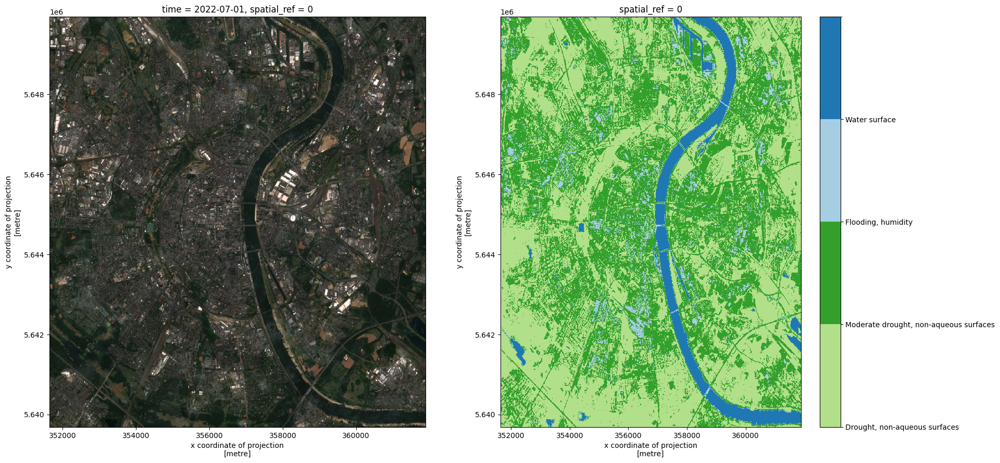

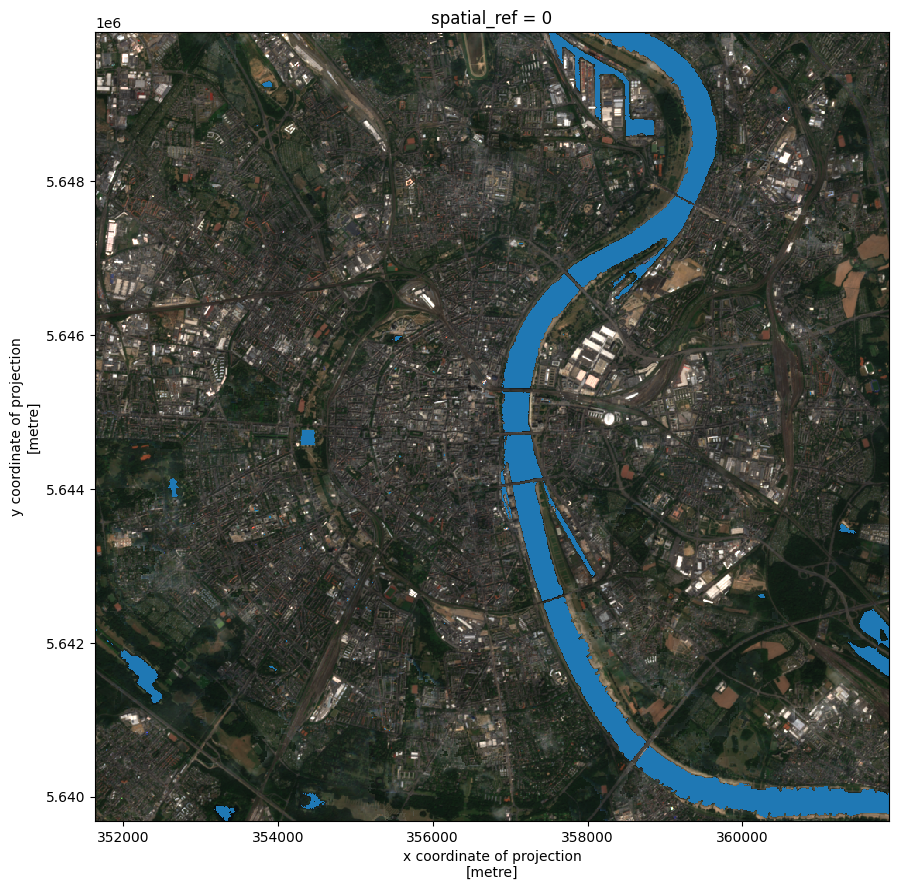

In [88]:
koeln_center_utm = [356766, 5644819]

koeln_rgb = await compute_rgb_array(center=koeln_center_utm, time=np.datetime64("2022-07-01T00:00:00"))

koeln_water = await compute_water_bodies(center=koeln_center_utm, time=np.datetime64("2022-07-01T00:00:00"))

plot(rbg_array=koeln_rgb, water_bodies_array=koeln_water)

/home/beilschmidt/git/geoengine-python/env/lib/python3.10/site-packages/rasterio/windows.py:314: RasterioDeprecationWarning: The height, width, and precision parameters are unused, deprecated, and will be removed in 2.0.0.
  warnings.warn(
/home/beilschmidt/git/geoengine-python/env/lib/python3.10/site-packages/rasterio/windows.py:314: RasterioDeprecationWarning: The height, width, and precision parameters are unused, deprecated, and will be removed in 2.0.0.
  warnings.warn(
/tmp/ipykernel_9616/3560293408.py:180: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/tmp/ipykernel_9616/3560293408.py:202: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


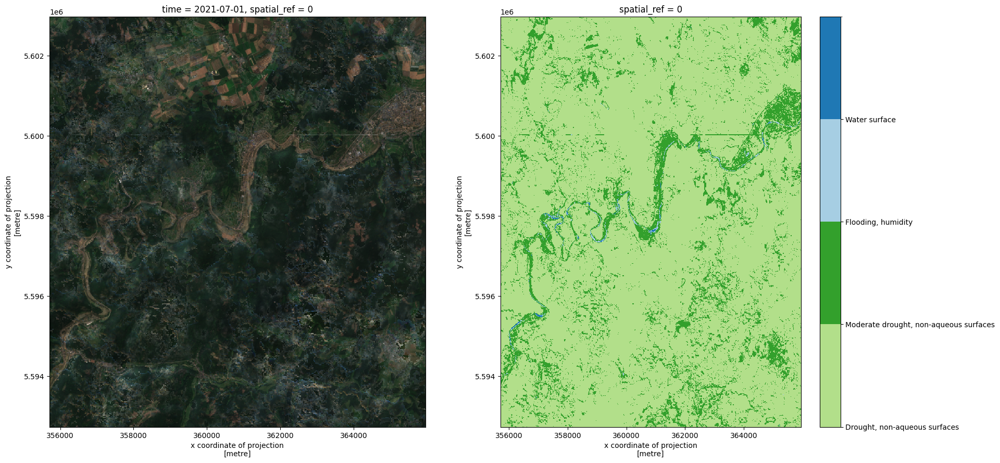

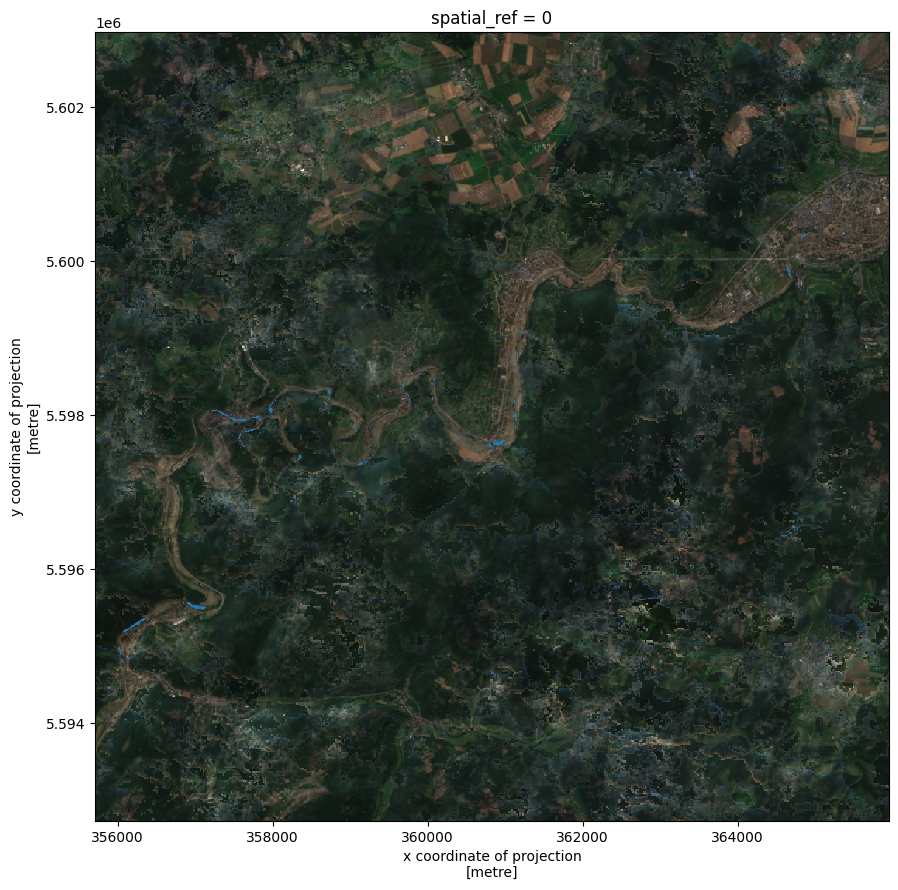

In [89]:
ahr_center_utm = [360830, 5597857]

ahr_rgb = await compute_rgb_array(center=ahr_center_utm, time=np.datetime64("2021-07-01T00:00:00"))

ahr_water = await compute_water_bodies(center=ahr_center_utm, time=np.datetime64("2021-07-01T00:00:00"))

plot(rbg_array=ahr_rgb, water_bodies_array=ahr_water)

In [90]:
ahr2_center_utm = [360830, 5597857]

ahr2_rgb = await compute_rgb_array(center=ahr2_center_utm, time=np.datetime64("2021-06-01T00:00:00"))

ahr2_water = await compute_water_bodies(center=ahr2_center_utm, time=np.datetime64("2021-06-01T00:00:00"))

plot(rbg_array=ahr2_rgb, water_bodies_array=ahr2_water)

/home/beilschmidt/git/geoengine-python/env/lib/python3.10/site-packages/rasterio/windows.py:314: RasterioDeprecationWarning: The height, width, and precision parameters are unused, deprecated, and will be removed in 2.0.0.
  warnings.warn(


In [ ]:
ahr3_center_utm = [360830, 5597857]

ahr3_rgb = await compute_rgb_array(center=ahr3_center_utm, time=np.datetime64("2022-06-01T00:00:00"))

ahr3_water = await compute_water_bodies(center=ahr3_center_utm, time=np.datetime64("2022-06-01T00:00:00"))

plot(rbg_array=ahr3_rgb, water_bodies_array=ahr3_water)

In [ ]:
ahr4_center_utm = [360830, 5597857]

ahr4_rgb = await compute_rgb_array(center=ahr4_center_utm, time=np.datetime64("2021-08-01T00:00:00"))

ahr4_water = await compute_water_bodies(center=ahr4_center_utm, time=np.datetime64("2021-08-01T00:00:00"))

plot(rbg_array=ahr4_rgb, water_bodies_array=ahr4_water)

In [5]:
def spatial_rationing_operator(band1: str, band2: str) -> ge.workflow_builder.operators.RasterOperator:
    return Expression(
        expression='''
            if C <= 2 || (C >= 8 && C <= 10) {
                NODATA
            } else {
                (A-B)/(A+B)
            }
        ''',
        output_type='F32',
        source=RasterStacker(
            sources=[
                GdalSource(f"_:5779494c-f3a2-48b3-8a2d-5fbba8c5b6c5:`UTM32N:{band1}`"),
                GdalSource(f"_:5779494c-f3a2-48b3-8a2d-5fbba8c5b6c5:`UTM32N:{band2}`"),
                RasterTypeConversion(
                    GdalSource("_:5779494c-f3a2-48b3-8a2d-5fbba8c5b6c5:`UTM32N:SCL`"),
                    output_data_type='U16',
                ),
            ],
        ),
    )

water_indices_workflow = TemporalRasterAggregation(
        aggregation_type='max',
        granularity='months',
        window_size=1,
        ignore_no_data=True,
        source=RasterStacker(
            sources=[
                spatial_rationing_operator("B03", "B08"), # NDWI
                spatial_rationing_operator("B03", "B11"), # MNDWI
                # spatial_rationing_operator("B05", "B11"), # SWI
            ],
        ),
    )

workflow = ge.register_workflow(water_indices_workflow)

water_indices_data_array = await workflow.raster_stream_into_xarray(
    query_rectangle=_query_rectangle(
        center=[360830, 5597857],
        time=np.datetime64("2021-06-01T00:00:00"),
    ),
    clip_to_query_rectangle=True,
    bands=[0, 1], # TODO: improve for user, default = all? where are the band names?
)

water_indices_data_array

/home/beilschmidt/git/geoengine-python/env/lib/python3.10/site-packages/rasterio/windows.py:314: RasterioDeprecationWarning: The height, width, and precision parameters are unused, deprecated, and will be removed in 2.0.0.
  warnings.warn(


<xarray.DataArray (time: 1, band: 2, y: 1025, x: 1024)>
array([[[[-0.5916387 , -0.61532795, -0.6347863 , ..., -0.35265902,
          -0.32628217, -0.32353517],
         [-0.6160714 , -0.599699  , -0.64266664, ..., -0.35308847,
          -0.32948896, -0.32707354],
         [-0.63054544, -0.5997035 , -0.6424028 , ..., -0.3480433 ,
          -0.32892892, -0.33517787],
         ...,
         [-0.72436225, -0.70967203, -0.73633903, ..., -0.47669092,
          -0.46770602, -0.48363253],
         [-0.7276278 , -0.73807   , -0.7400072 , ..., -0.49131992,
          -0.49575692, -0.50208336],
         [-0.7180443 , -0.7348108 , -0.731997  , ..., -0.4934924 ,
          -0.5117707 , -0.5       ]],

        [[-0.4523154 , -0.46625766, -0.48140496, ..., -0.2378611 ,
          -0.22804879, -0.22499248],
         [-0.46662366, -0.4587996 , -0.48102248, ..., -0.21986675,
          -0.213253  , -0.21188708],
         [-0.45036516, -0.43083003, -0.45693588, ..., -0.20462146,
          -0.19878972, -0.20876518],
         ...,
         [-0.3554844 , -0.36117217, -0.48137638, ..., -0.227833  ,
          -0.2352    , -0.25965178],
         [-0.4200378 , -0.42923078, -0.4403101 , ..., -0.25172275,
          -0.25273833, -0.270229  ],
         [-0.45697898, -0.46512523, -0.4252505 , ..., -0.2403416 ,
          -0.23033482, -0.25742203]]]], dtype=float32)
Coordinates:
  * x            (x) float64 3.557e+05 3.557e+05 ... 3.659e+05 3.659e+05
  * y            (y) float64 5.603e+06 5.603e+06 ... 5.593e+06 5.593e+06
  * time         (time) datetime64[ns] 2021-06-01
  * band         (band) int64 0 1
    spatial_ref  int64 0

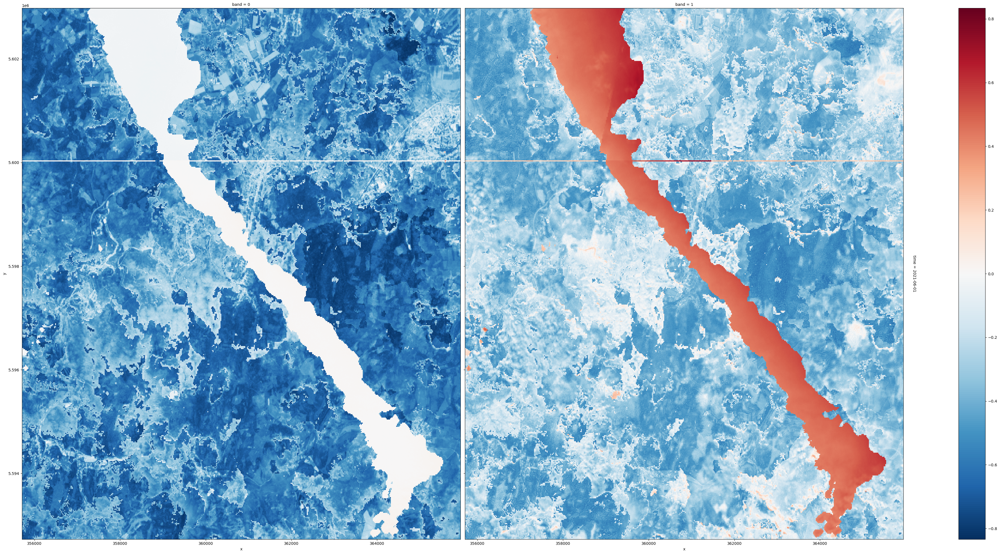

In [7]:
water_indices_data_array.plot.imshow(
    col = "band",
    row = "time",
    size = 20,
)

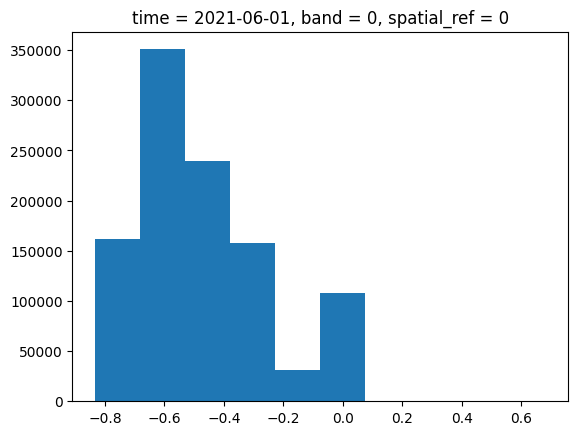

(array([ 18147., 283585., 305349., 226421.,  95389.,  13056.,   2956.,
         33695.,  65261.,   5713.]),
 array([-0.68313068, -0.5411132 , -0.39909574, -0.25707829, -0.11506082,
         0.02695665,  0.16897412,  0.31099159,  0.45300904,  0.59502649,
         0.73704398]),
 <BarContainer object of 10 artists>)

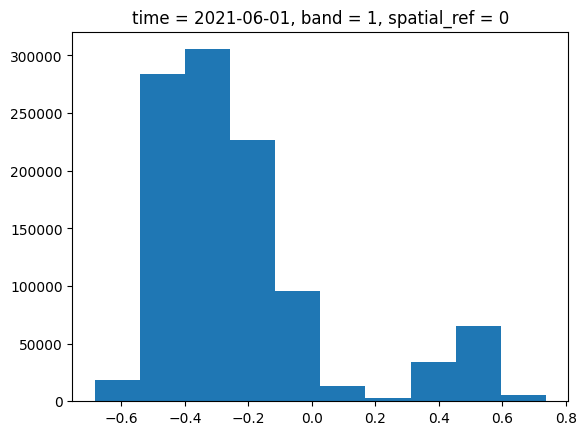

In [11]:
water_indices_data_array.isel(time = 0, band = 0).plot.hist()
plt.show()
water_indices_data_array.isel(time = 0, band = 1).plot.hist()

In [14]:
hoenningen = [354969, 5593173]

rgb_single_day = ge.register_workflow(
    TemporalRasterAggregation(
        aggregation_type='mean',
        granularity='days',
        window_size=1,
        ignore_no_data=True,
        source=RasterStacker(
            sources=[
                GdalSource("_:5779494c-f3a2-48b3-8a2d-5fbba8c5b6c5:`UTM32N:B04`"),
                GdalSource("_:5779494c-f3a2-48b3-8a2d-5fbba8c5b6c5:`UTM32N:B03`"),
                GdalSource("_:5779494c-f3a2-48b3-8a2d-5fbba8c5b6c5:`UTM32N:B02`"),
            ],
            rename=RenameBands.rename(['red', 'green', 'blue']),
        )
    )
)

rgb_hoenningen_1 = await rgb_single_day.raster_stream_into_xarray(
    query_rectangle=_query_rectangle(
        center=hoenningen,
        time=np.datetime64("2021-06-13T00:00:00"),
    ),
    clip_to_query_rectangle=True,
    bands=[0, 1, 2], # TODO: improve for user, default = all? where are the band names?
)

rgb_hoenningen_2 = await rgb_single_day.raster_stream_into_xarray(
    query_rectangle=_query_rectangle(
        center=hoenningen,
        time=np.datetime64("2021-06-18T00:00:00"),
    ),
    clip_to_query_rectangle=True,
    bands=[0, 1, 2], # TODO: improve for user, default = all? where are the band names?
)

/home/beilschmidt/git/geoengine-python/env/lib/python3.10/site-packages/rasterio/windows.py:314: RasterioDeprecationWarning: The height, width, and precision parameters are unused, deprecated, and will be removed in 2.0.0.
  warnings.warn(


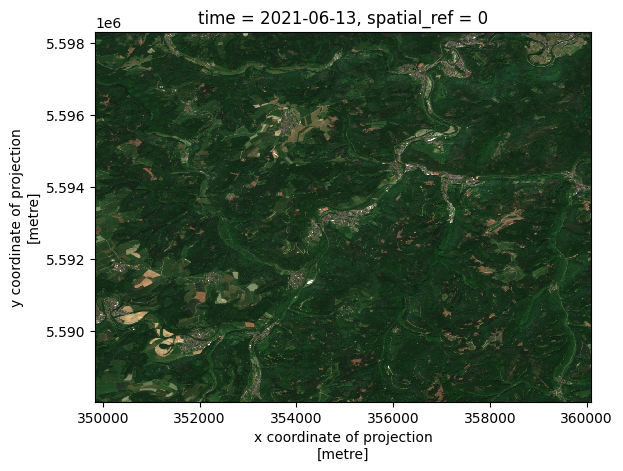

In [ ]:
rgb_hoenningen_1.isel(time=0).plot.imshow(
    rgb="band",
    vmax=2500,
)
plt.show()
rgb_hoenningen_2.isel(time=0).plot.imshow(
    rgb="band",
    vmax=2500,
)